# 1. Métodos de reducción de ruido 

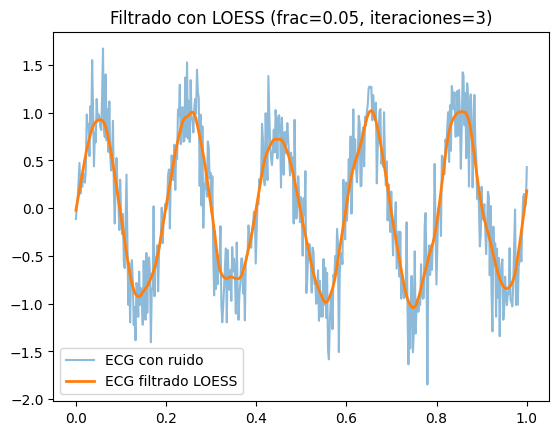

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

# Simulación de una señal ECG con ruido
t = np.linspace(0, 1, 500)
ecg = np.sin(2 * np.pi * 5 * t) + 0.3 * np.random.randn(500)

# Aplicación de LOESS
ecg_loess = lowess(ecg, t, frac=0.05, it=3, return_sorted=False)

# Visualización
plt.plot(t, ecg, label="ECG con ruido", alpha=0.5)
plt.plot(t, ecg_loess, label="ECG filtrado LOESS", linewidth=2)
plt.legend()
plt.title("Filtrado con LOESS (frac=0.05, iteraciones=3)")
plt.show()

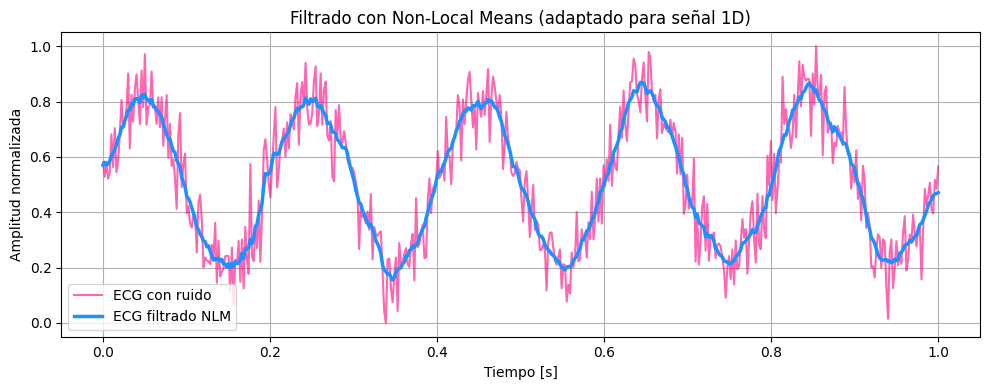

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import denoise_nl_means, estimate_sigma

# Simular señal ECG con ruido
t = np.linspace(0, 1, 500)
ecg = np.sin(2 * np.pi * 5 * t) + 0.3 * np.random.randn(500)

# Normalizar entre 0 y 1
ecg_norm = (ecg - np.min(ecg)) / (np.max(ecg) - np.min(ecg))

# Convertir a forma 2D: 1 fila x 500 columnas
ecg_2d = ecg_norm[np.newaxis, :]

# Estimar sigma
sigma_est = np.std(ecg_2d)

# Aplicar NLM
ecg_nlm_result = denoise_nl_means(
    ecg_2d,
    h=1.15 * sigma_est,
    fast_mode=True,
    patch_size=5,
    patch_distance=6,
    channel_axis=None
)

# Verificar forma y extraer correctamente
if ecg_nlm_result.ndim == 2:
    ecg_nlm = ecg_nlm_result[0]
else:
    ecg_nlm = ecg_nlm_result  # ya está en 1D

plt.figure(figsize=(10, 4))
plt.plot(t, ecg_norm, label="ECG con ruido", color="#FF0080", alpha=0.6, linewidth=1.5)
plt.plot(t, ecg_nlm, label="ECG filtrado NLM", color="#1E90FF", linewidth=2.5)
plt.title("Filtrado con Non-Local Means (adaptado para señal 1D)")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud normalizada")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# 3. Código para usar los Filtros Wavelet utilizando varias familias de Wavelet 

In [33]:
pip install PyWavelets

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [34]:
# Librerías
import numpy as np
import pywt
import matplotlib.pyplot as plt
import glob
import pandas as pd
from scipy.signal import find_peaks

Primero cargamos el archivo de ECGData, el cual contiene 10646 archivos sin filtrar de pacientes 

In [ ]:
# Librerías
import numpy as np
import matplotlib.pyplot as plt
import glob

# Función para cargar la derivación II
def cargar_derivacion_II(ruta_archivo):
    data = np.genfromtxt(ruta_archivo, delimiter=',', skip_header=1)
    lead_II = data[:, 1]  # segunda columna es Lead II
    return lead_II


ruta_carpeta = r'.\Datos\ECGData\*.csv' 
lista_archivos = glob.glob(ruta_carpeta)

print(f"Se encontraron {len(lista_archivos)} archivos.")

Se encontraron 10646 archivos.


Luego extraemos la derivación II de 10 pacientes y visualizamos la señal sin filtrar

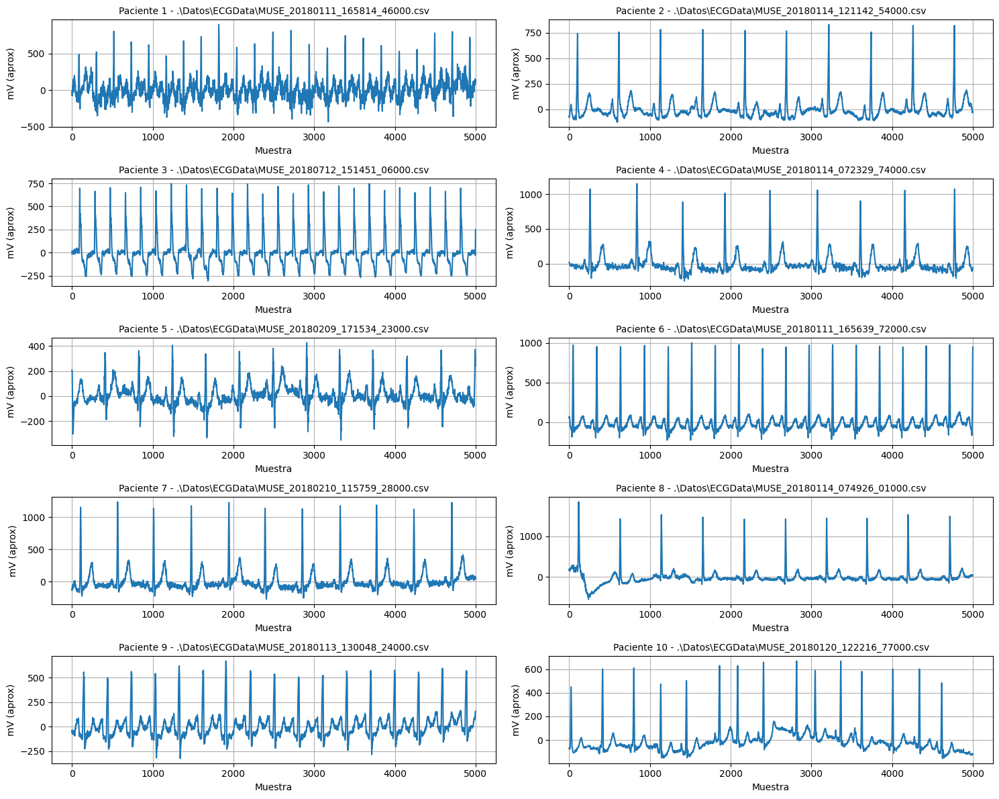

In [102]:
# Escogemos 10 archivos aleatorios
np.random.seed(42)  # con seed(42) se garantiza que siempre se trabajen con los mismos 10 pacientes
archivos_10 = np.random.choice(lista_archivos, size=10, replace=False)

# raficamos las 10 señales en un solo gráfico (5 filas x 2 columnas)
fig, axes = plt.subplots(5, 2, figsize=(15, 12))
axes = axes.flatten()  # para iterar fácilmente

for i, archivo in enumerate(archivos_10):
    ecg_signal = cargar_derivacion_II(archivo)
    
    axes[i].plot(ecg_signal)
    axes[i].set_title(f'Paciente {i+1} - {archivo.split("/")[-1]}', fontsize=10)
    axes[i].set_xlabel('Muestra')
    axes[i].set_ylabel('mV (aprox)')
    axes[i].grid()

plt.tight_layout()
plt.show()


### Comparación de diferentes familias de wavelet para el filtrado de señales ECG
Para determinar la wavelet más adecuada para el filtrado de las señales ECG, se implementó un flujo de procesamiento basado en la Transformada Wavelet Discreta (DWT), siguiendo las recomendaciones de la literatura. Se compararon las siguientes familias de wavelet:

1. Haar (db1): Es la Wavelet más básica, util para remover el componente DC, pero no es adecuada para preservar la forma del complejo QRS. No se espera un resultado óptimo, pero igual también se evaluará.
2. Daubechies 4 (db4): Ampliamente utilizada para el análisis de ECG debido a que su forma de escalamiento es similar al complejo QRS.
3. Symlet 4 (sym4): Variante más simétrica de Daubechies, recomendada para preservar la morfología de la señal.
4. Coiflet 1 (coif1): Diseñada para capturar tanto detalles de alta frecuencia como tendencias lentas, útil para conservar la información morfológica del ECG.
5. Biorthogonal 3.3 (bior3.3): Familia que garantiza una reconstrucción perfecta sin distorsión de fase, preservando de forma óptima la forma original de las ondas.


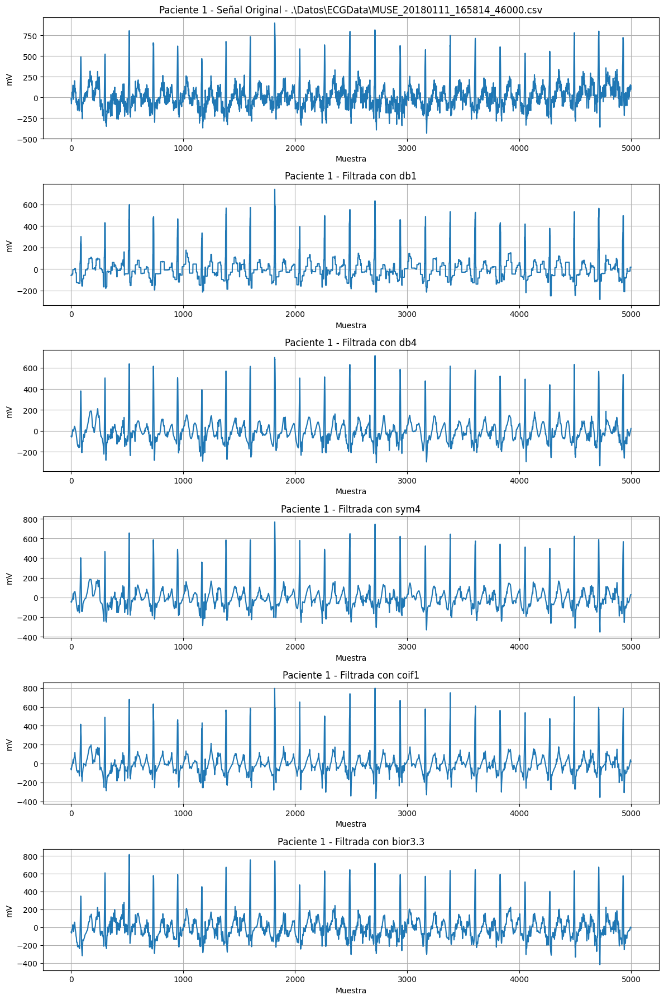

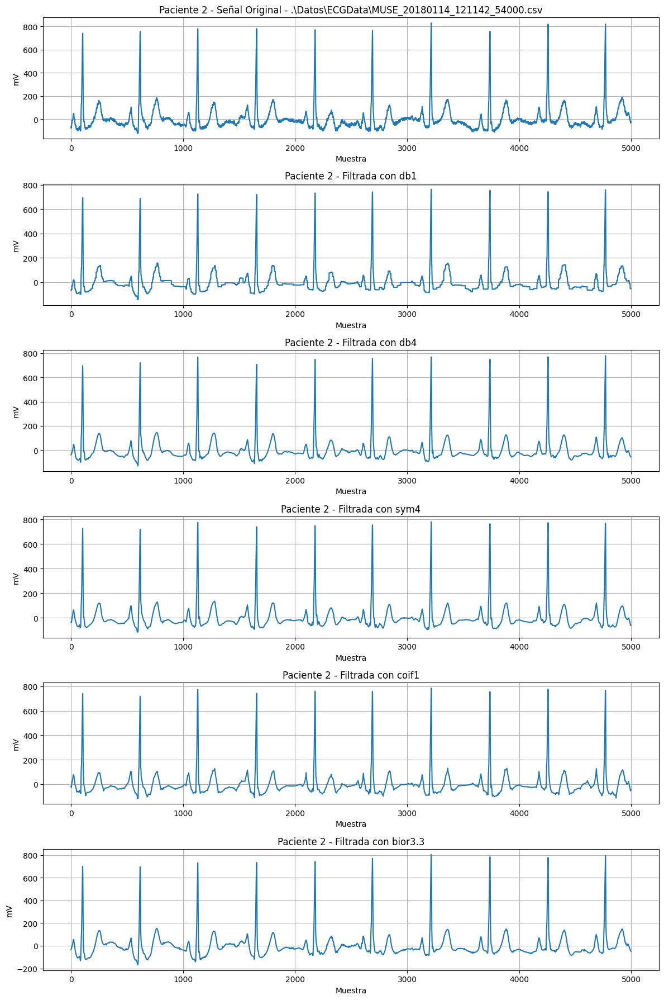

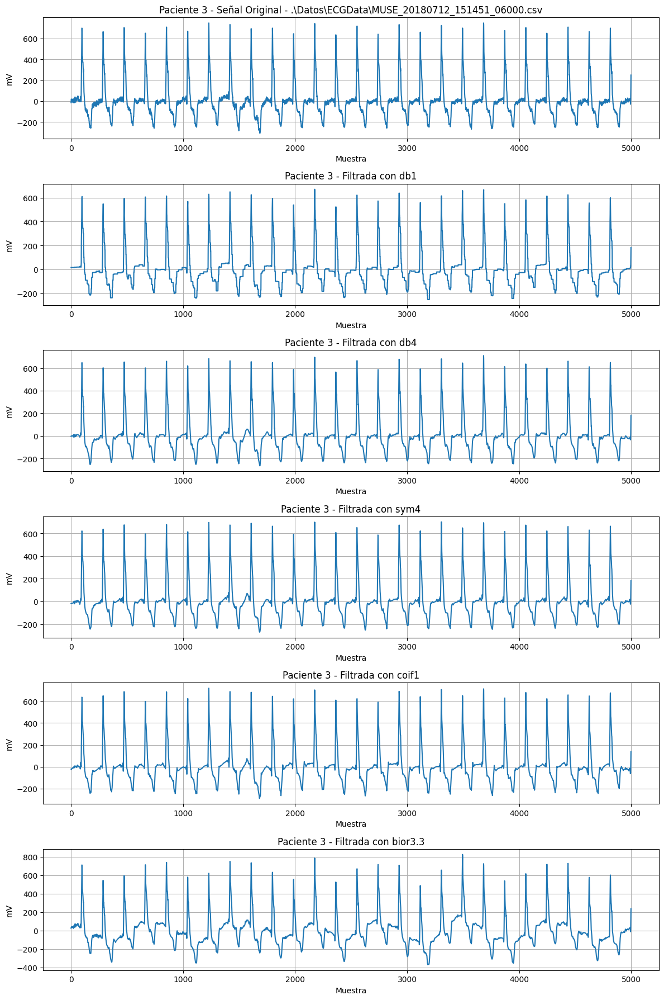

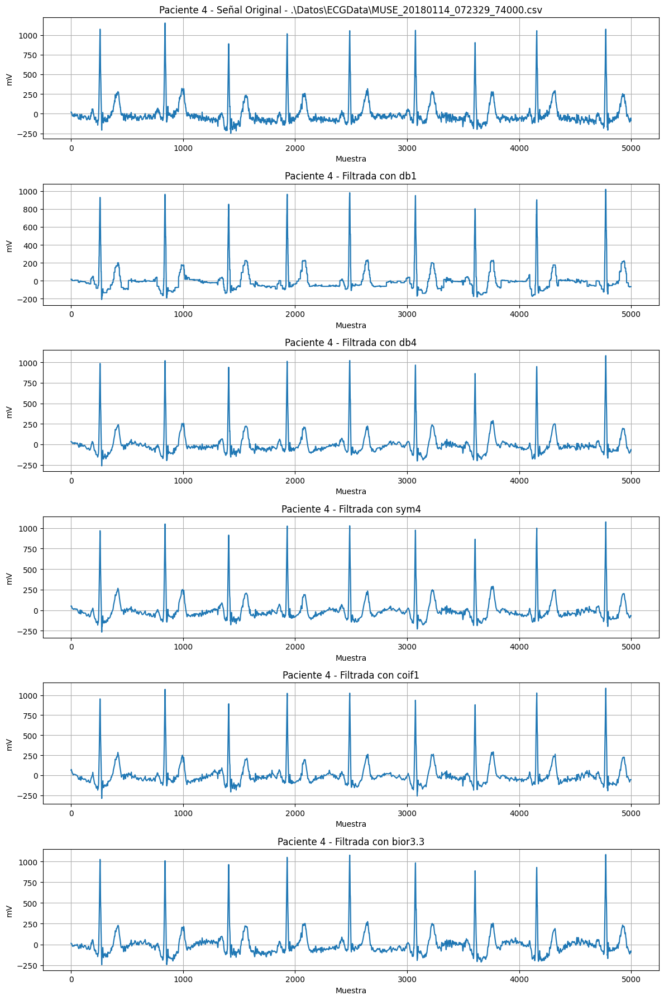

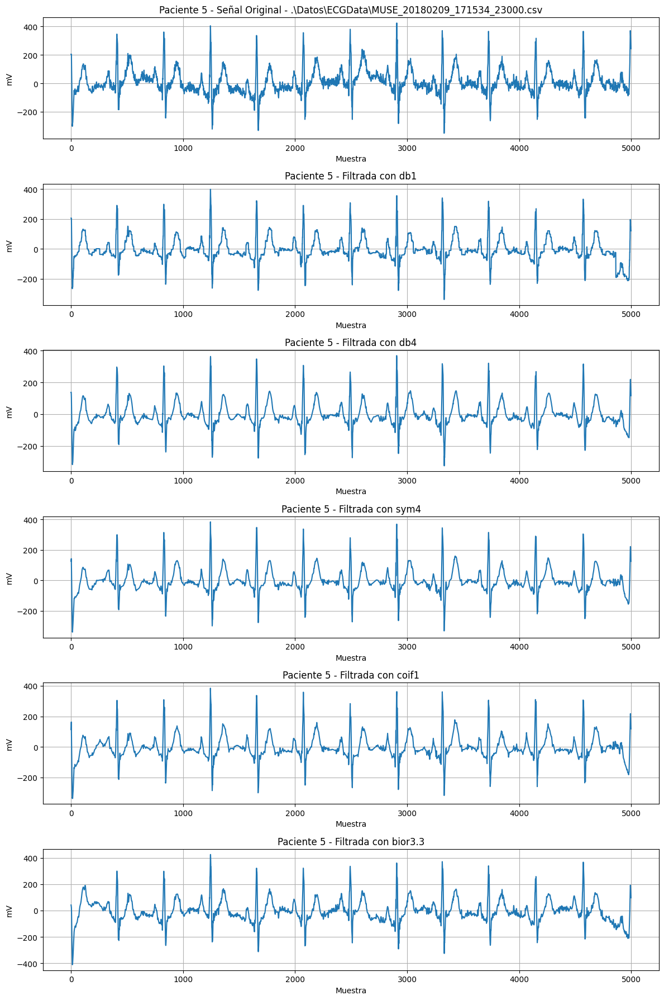

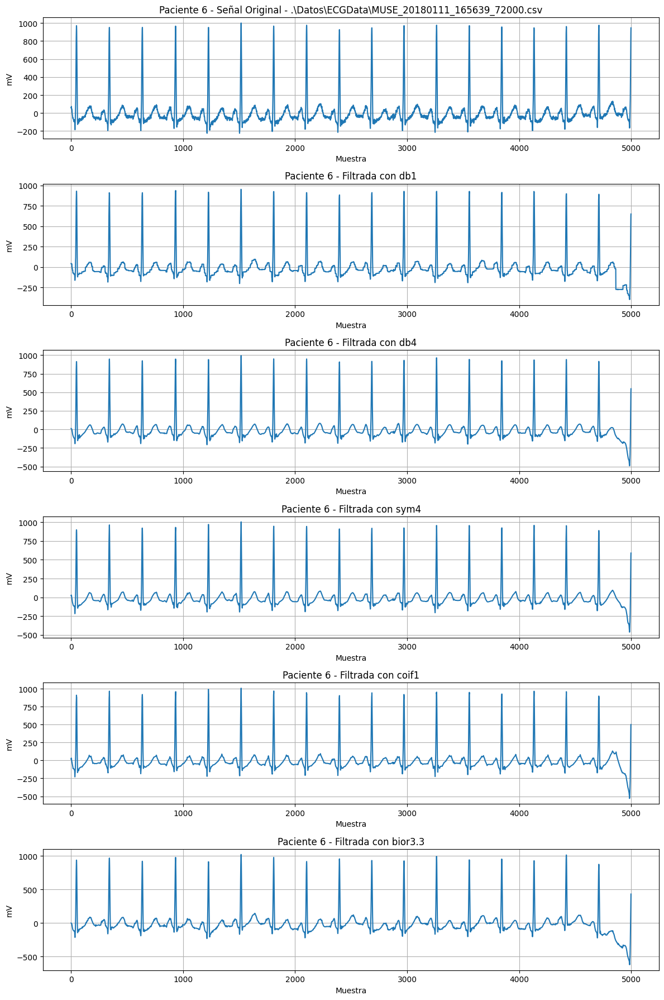

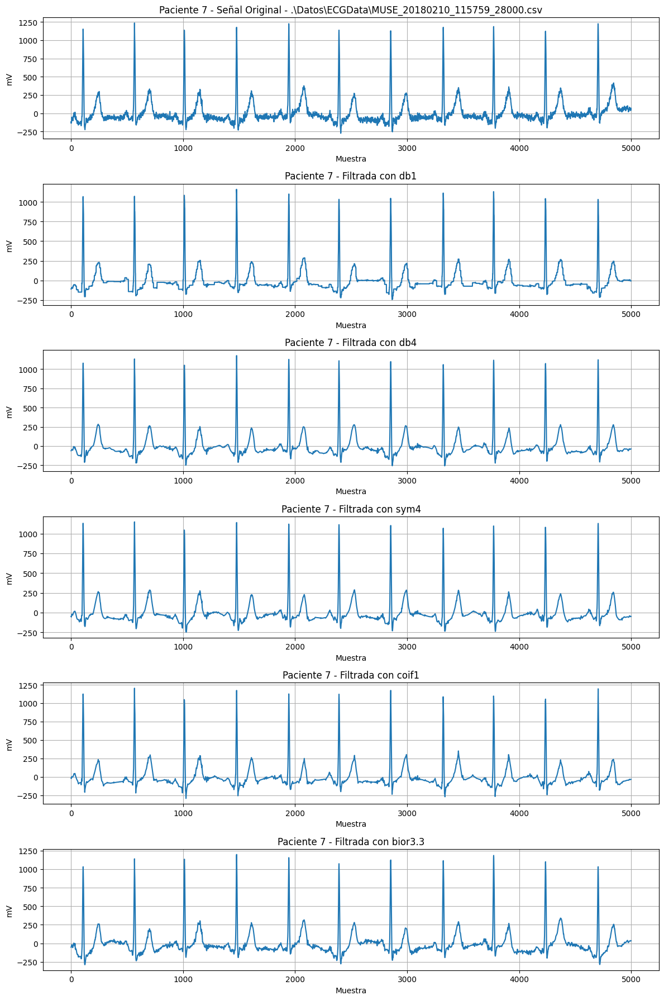

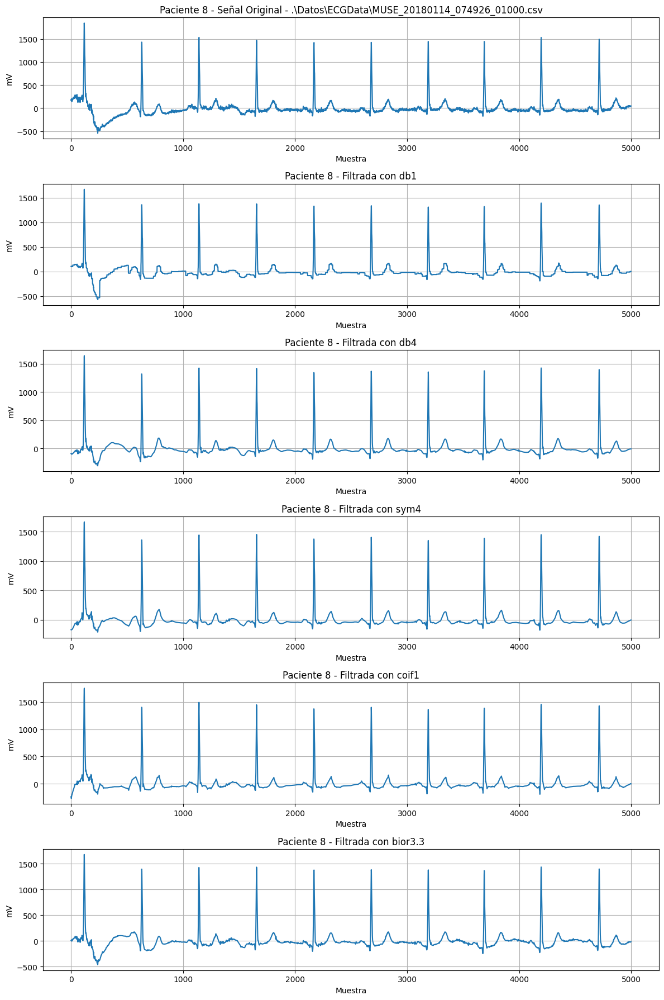

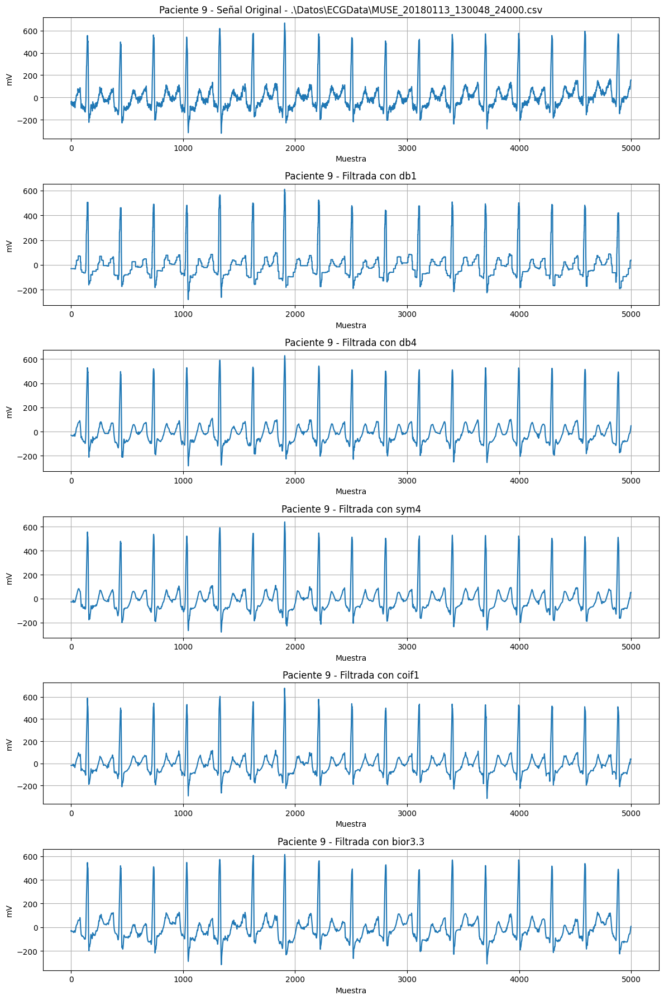

c:\Python312\Lib\site-packages\pywt\_thresholding.py:22: RuntimeWarning: invalid value encountered in divide
  thresholded = (1 - value/magnitude)


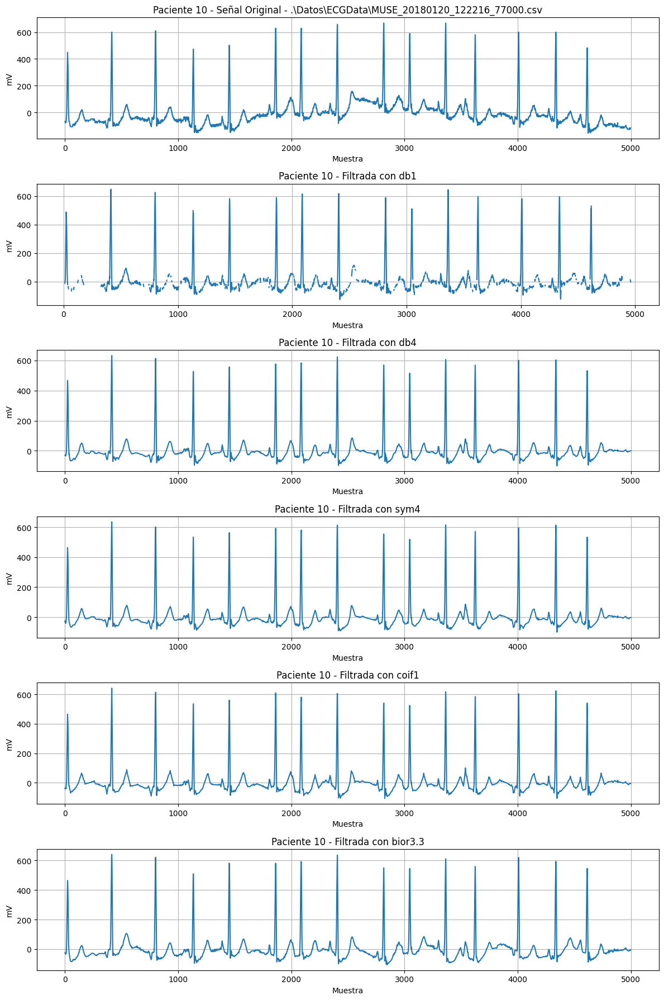

In [103]:
# Librerías
import numpy as np
import matplotlib.pyplot as plt
import glob
import pywt

# Función para cargar la derivación II
def cargar_derivacion_II(ruta_archivo):
    data = np.genfromtxt(ruta_archivo, delimiter=',', skip_header=1)
    lead_II = data[:, 1]  # segunda columna es Lead II
    return lead_II

# Función para aplicar filtrado wavelet
def filtrar_wavelet(signal, wavelet_name, nivel=8): # Se aplica la transformada, se descompone la sñal en 8 niveles de detalle y aproximación
    coeffs = pywt.wavedec(signal, wavelet_name, level=nivel)
    
    # coeffs[0] es la aproximación 8 que contiene la parte más lenta de la señal (linea base)
    # Del coeffs[1] al coeffs[8] contienen los detalles, los componentes de frecuencias más altas

    # Eliminar componente de línea base
    coeffs[0] = np.zeros_like(coeffs[0])   #Eliminamos la linea base (componentes de baja frecuencia) para que la señal vaya referenciada en cero.
    
    # Umbralizar detalles para reducción de ruido
    cD1 = coeffs[-1]
    sigma_est = np.median(np.abs(cD1)) / 0.6745 # se estima el nivel de ruido, está en el primer nivel
    threshold = sigma_est * np.sqrt(2 * np.log(len(signal)))    #Se calcula el umbral del friltrado
    
    for i in range(1, len(coeffs)):
        coeffs[i] = pywt.threshold(coeffs[i], threshold, mode='soft')   #Este es el filtro, en el cual los coeficientes más pequeños (probablemente ruido) se hacen más pequeños y se conservan los grandes
    
    signal_filtrada = pywt.waverec(coeffs, wavelet_name)    #Se construye la señal completa sin linea base, con menos ruido y conservando el complejo QRS
    return signal_filtrada

# Seleccionar 10 archivos aleatorios
np.random.seed(42)
pacientes_seleccionados = np.random.choice(lista_archivos, size=10, replace=False)

# Definir las wavelets a comparar (incluyendo Haar → 'db1')
familias_wavelet = ['db1', 'db4', 'sym4', 'coif1', 'bior3.3']

# Procesar y graficar
for i, archivo in enumerate(pacientes_seleccionados):
    ecg_signal = cargar_derivacion_II(archivo)
    
    # Crear figura: 1 fila por wavelet + la señal original
    n_wavelets = len(familias_wavelet)
    fig, axes = plt.subplots(n_wavelets + 1, 1, figsize=(12, 3*(n_wavelets+1)))
    
    # Graficar señal original
    axes[0].plot(ecg_signal)
    axes[0].set_title(f'Paciente {i+1} - Señal Original - {archivo.split("/")[-1]}', fontsize=12)
    axes[0].set_xlabel('Muestra')
    axes[0].set_ylabel('mV')
    axes[0].grid()
    
    # Graficar señales filtradas con cada wavelet
    for j, wavelet_name in enumerate(familias_wavelet):
        ecg_filtrada = filtrar_wavelet(ecg_signal, wavelet_name=wavelet_name, nivel=8)
        
        axes[j+1].plot(ecg_filtrada)
        axes[j+1].set_title(f'Paciente {i+1} - Filtrada con {wavelet_name}', fontsize=12)
        axes[j+1].set_xlabel('Muestra')
        axes[j+1].set_ylabel('mV')
        axes[j+1].grid()
    
    plt.tight_layout()
    plt.show()


Con el fin del encontrafr cual fue la mejor Wavelet de una forma no visual, calculamos:

***PSNR  (Relación señal-ruido pico):*** Para mirar cuánto de ha modificado la señal al aplicar el filtro. Cuando más alto sea el valor PSNR, más parecida derá la señal a la original, o sea que se conservan bien las ondas P, QRS y T.
$$
PSNR = 10 \cdot \log_{10} \left( \frac{MAX^2}{MSE} \right)
$$
- \( MAX \): valor máximo de la señal original  
- \( MSE \): error cuadrático medio entre la señal original y la señal filtrada

***SRN (Relación señal a ruido):*** Mide la candidad de riodo que queda en la señal después del filtrado. Entre más alto sea el SNR, mejor, pues indicaría que la señal se ha filtrado muy bien y por lo tanto está limpia.
$$
SNR = 10 \cdot \log_{10} \left( \frac{ \sum x^2 }{ \sum (x - y)^2 } \right)
$$

- \( x \): señal original  
- \( y \): señal filtrada  
- Numerador: energía de la señal original  
- Denominador: energía del error

***Correlación de Pearson entre señal original y señal filtrada:*** Mide qué tanto se parece la señal filtrada a la señal original, en donde 0 es que no se parece nada, y 1 es que es idéntico.
$$
\rho = \frac{ cov(x, y) }{ std(x) \cdot std(y) }
$$

- \( \rho \): coeficiente de correlación  
- \( cov(x, y) \): covarianza entre las señales  
- \( std(x), std(y) \): desviaciones estándar de cada señal

In [38]:
# Función para calcular MSE
def mse(x, y):
    return np.mean((x - y) ** 2)

# Función para calcular PSNR
def psnr(x, y):
    mse_val = mse(x, y)
    max_val = np.max(x)
    return 10 * np.log10((max_val ** 2) / mse_val)

# Función para calcular SNR
def snr(x, y):
    signal_power = np.sum(x ** 2)
    noise_power = np.sum((x - y) ** 2)
    return 10 * np.log10(signal_power / noise_power)

# Función para calcular correlación de Pearson
def correlacion(x, y):
    return np.corrcoef(x, y)[0, 1]


In [39]:
# Diccionario para guardar resultados
resultados = {}

# Procesar y calcular métricas
for i, archivo in enumerate(pacientes_seleccionados):
    ecg_signal = cargar_derivacion_II(archivo)
    
    paciente_name = f'Paciente {i+1}'
    resultados[paciente_name] = {}
    
    for wavelet_name in familias_wavelet:
        ecg_filtrada = filtrar_wavelet(ecg_signal, wavelet_name=wavelet_name, nivel=8)
        
        # Calcular métricas
        psnr_val = psnr(ecg_signal, ecg_filtrada)
        snr_val = snr(ecg_signal, ecg_filtrada)
        corr_val = correlacion(ecg_signal, ecg_filtrada)
        
        # Guardar resultados
        resultados[paciente_name][wavelet_name] = {
            'PSNR': psnr_val,
            'SNR': snr_val,
            'Correlacion': corr_val
        }



In [40]:
import pandas as pd

# Crear lista para guardar filas de la tabla
tabla_rows = []

# Recorrer el diccionario de resultados
for paciente, waves in resultados.items():
    for wavelet_name, metrics in waves.items():
        row = {
            'Paciente': paciente,
            'Wavelet': wavelet_name,
            'PSNR (dB)': metrics['PSNR'],
            'SNR (dB)': metrics['SNR'],
            'Correlacion': metrics['Correlacion']
        }
        tabla_rows.append(row)

# Crear DataFrame
df_resultados = pd.DataFrame(tabla_rows)

# Ordenar tabla por paciente y wavelet
df_resultados = df_resultados.sort_values(by=['Paciente', 'Wavelet']).reset_index(drop=True)

# Mostrar tabla ordenada
print(df_resultados)

# Si quieres, puedes exportarla a Excel o CSV:
# df_resultados.to_excel('resultados_wavelet_ecg.xlsx', index=False)
# df_resultados.to_csv('resultados_wavelet_ecg.csv', index=False)


       Paciente  Wavelet  PSNR (dB)   SNR (dB)  Correlacion
0    Paciente 1  bior3.3  22.977064   7.725282     0.915110
1    Paciente 1    coif1  22.548090   7.296308     0.917998
2    Paciente 1      db1  21.378590   6.126808     0.891443
3    Paciente 1      db4  22.879826   7.628044     0.922932
4    Paciente 1     sym4  22.952092   7.700309     0.925332
5   Paciente 10  bior3.3  21.581131   5.616520     0.856161
6   Paciente 10    coif1  22.117629   6.153018     0.875483
7   Paciente 10      db1        NaN        NaN          NaN
8   Paciente 10      db4  22.173851   6.209241     0.876986
9   Paciente 10     sym4  22.141742   6.177131     0.876152
10   Paciente 2  bior3.3  29.559921  12.069717     0.968799
11   Paciente 2    coif1  28.262055  10.771850     0.958020
12   Paciente 2      db1  31.312675  13.822471     0.980217
13   Paciente 2      db4  30.575381  13.085177     0.976179
14   Paciente 2     sym4  29.370293  11.880089     0.967910
15   Paciente 3  bior3.3  19.925124   6.

En casi todas las señales se observa resultados de correlación cercanos a 1, por lo que tienen una buena correlación, o sea un muy parecido con la señal original. Sin embargo, la db1 es la que muestra peores resultados, tal como esperabamos, por ejemplo en el paciente 10, muestra NaN, y la gráfica de ese paciente se ve mal construida, por lo que no logró preservar bien la señal, lo que quiere decir que posiblemente la señal no se pudo reconstruir adecuadamente con la db1, pues esta es la wavelet más simple.

La wavelet coif1 también mostró un rendimiento aceptable, aunque en algunos casos su SNR fue un poco bajo. 

La wavelet bior3.3, pese a garantizar simetría perfecta, mostró en varios pacientes valores de SNR y correlación inferiores a las demás.

Las wavelets db4 y sym4 en general muestran los mejores resultados en términos de relación señal a ruido (SNR) y preservación de la morfología de las ondas, como se refleja en los altos valores de correlación (>0.95 en la mayoría de los pacientes).

# 4. Escoger 10 señales al azar y aplicar un flujo de procesamiento que conste de: 



### Flujo 1
• ***Filtro pasa-altas usando filtro IIR a 0.5 Hz. Justificar la elección de parámetros***

• ***Filtro wavelet modificado del punto 3***

• ***Filtrado pasabajas 50 Hz. Justificar la elección de parámetros y si se usa FIR o IIR***

Filtro wavelet modificado con Daubechies 4 (db4), comúnmente usado para ECG. Se eliminan los primeros dos niveles de detalle para suprimir ruido de alta frecuencia.

In [70]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import scipy.signal as signal
import pywt
import os
import glob
import random

In [71]:
def filtro_wavelet(ecg, wavelet="db4", nivel=4):
    coeffs = pywt.wavedec(ecg, wavelet, level=nivel)
    coeffs[1] = np.zeros_like(coeffs[1])
    coeffs[2] = np.zeros_like(coeffs[2])
    return pywt.waverec(coeffs, wavelet)

Flujo 1 de procesamiento con wavelet configurable:

    1. Filtro pasaaltas IIR Butterworth a 0.5 Hz (elimina línea base)

    2. Filtro wavelet configurable para suprimir ruido de alta frecuencia sin distorsionar el QRS

    3. Filtro pasabajas IIR Butterworth a 50 Hz (reduce ruido muscular y de red)

In [72]:
def cargar_derivacion_II_csv(ruta_archivo, nombre_columna="II"):
    df = pd.read_csv(ruta_archivo)
    if nombre_columna not in df.columns:
        raise ValueError(f"La columna '{nombre_columna}' no se encuentra en {ruta_archivo}.")
    return df[nombre_columna].values

In [73]:
def flujo_1(ecg, fs=500, wavelet_name="db4"):
    b_hp, a_hp = signal.butter(N=2, Wn=0.5 / (fs/2), btype='highpass')
    senal_hp = signal.filtfilt(b_hp, a_hp, ecg)
    senal_wavelet = filtro_wavelet(senal_hp, wavelet=wavelet_name, nivel=4)
    b_lp, a_lp = signal.butter(N=4, Wn=50 / (fs/2), btype='lowpass')
    senal_filtrada = signal.filtfilt(b_lp, a_lp, senal_wavelet)
    return senal_filtrada

Se encontraron 10646 archivos CSV.


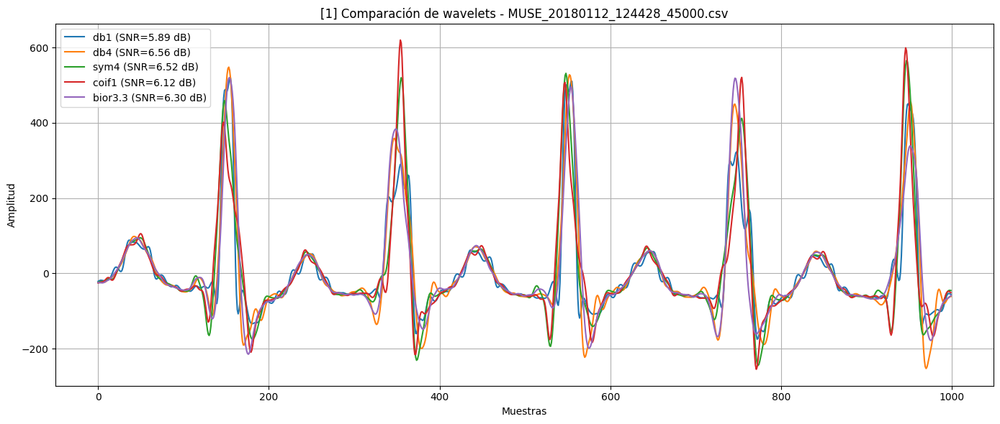

→ Mejor wavelet para MUSE_20180112_124428_45000.csv: db4 (SNR=6.56 dB)


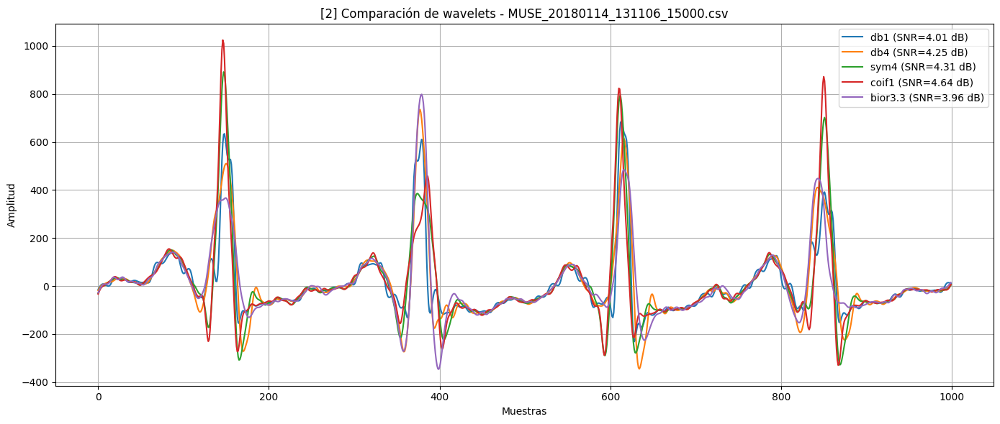

→ Mejor wavelet para MUSE_20180114_131106_15000.csv: coif1 (SNR=4.64 dB)


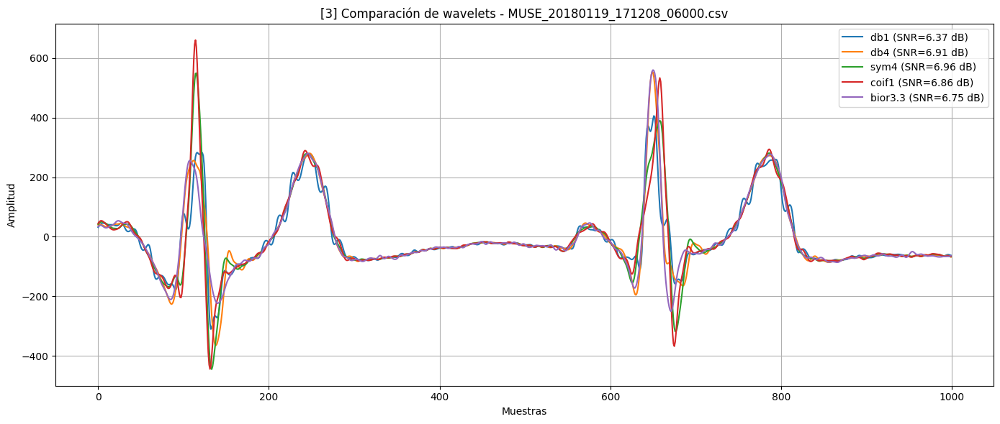

→ Mejor wavelet para MUSE_20180119_171208_06000.csv: sym4 (SNR=6.96 dB)


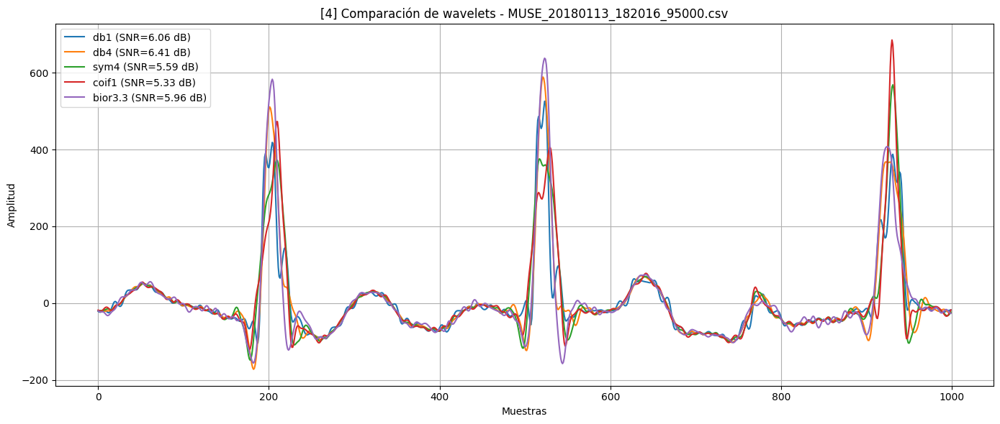

→ Mejor wavelet para MUSE_20180113_182016_95000.csv: db4 (SNR=6.41 dB)


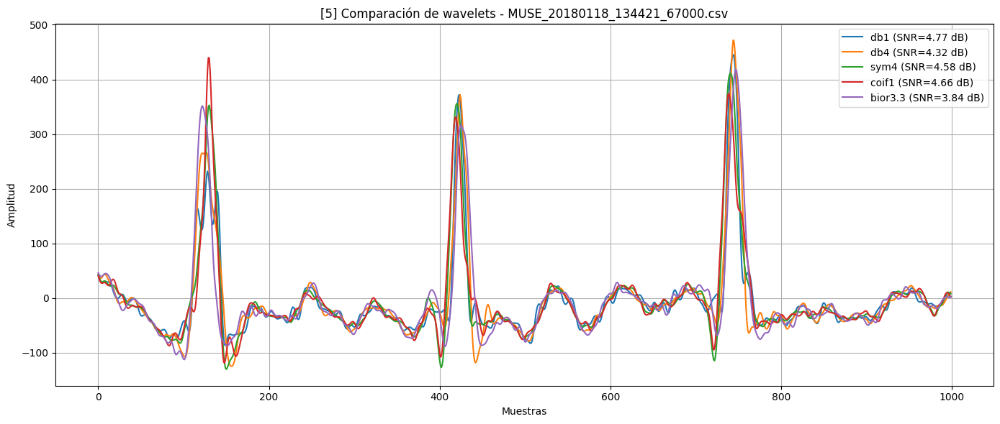

→ Mejor wavelet para MUSE_20180118_134421_67000.csv: db1 (SNR=4.77 dB)


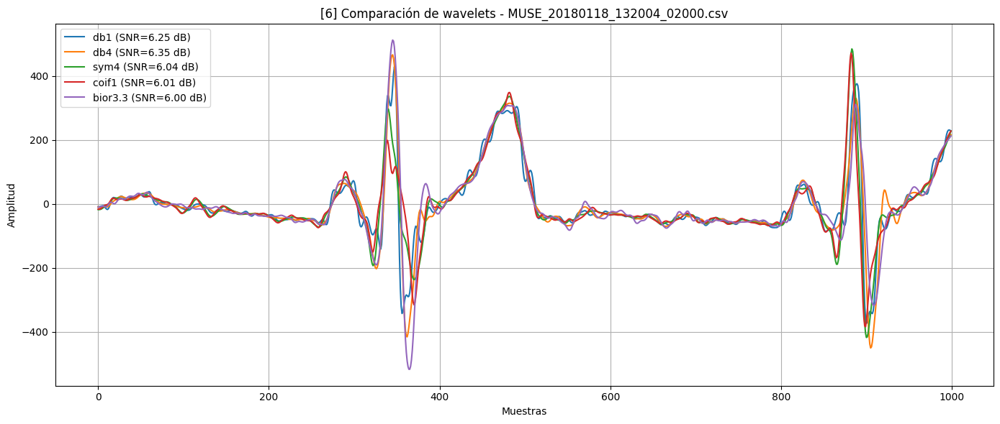

→ Mejor wavelet para MUSE_20180118_132004_02000.csv: db4 (SNR=6.35 dB)


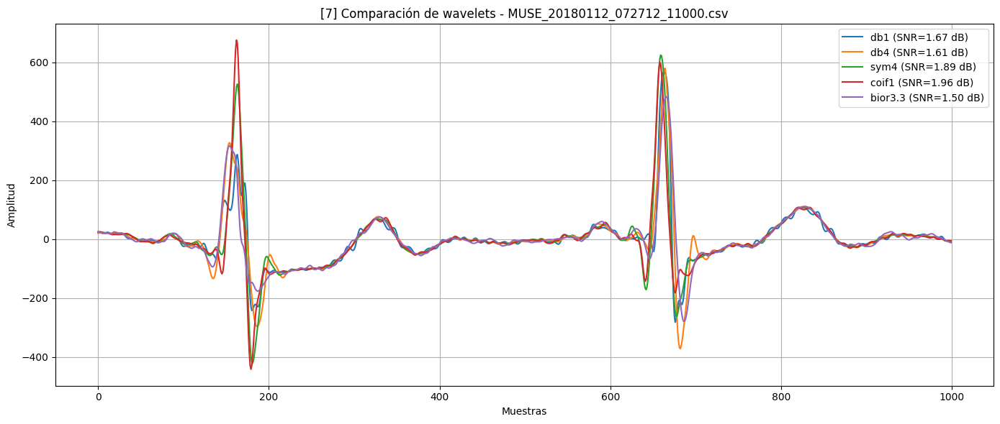

→ Mejor wavelet para MUSE_20180112_072712_11000.csv: coif1 (SNR=1.96 dB)


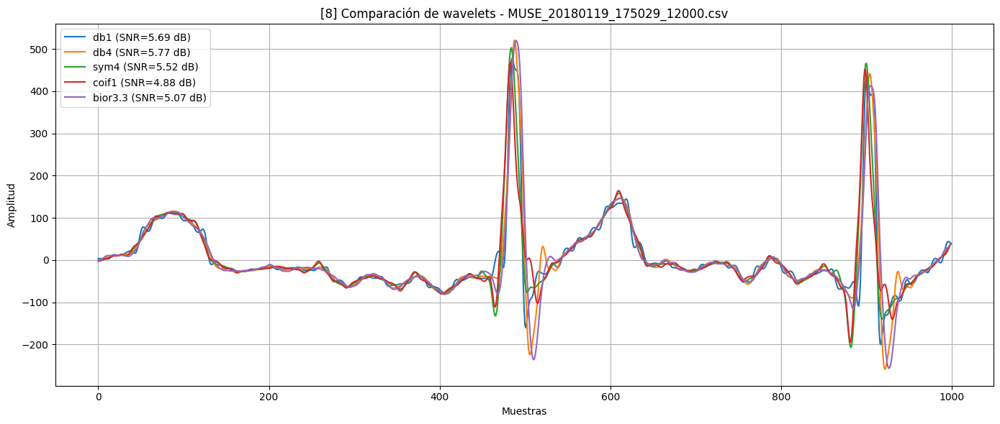

→ Mejor wavelet para MUSE_20180119_175029_12000.csv: db4 (SNR=5.77 dB)


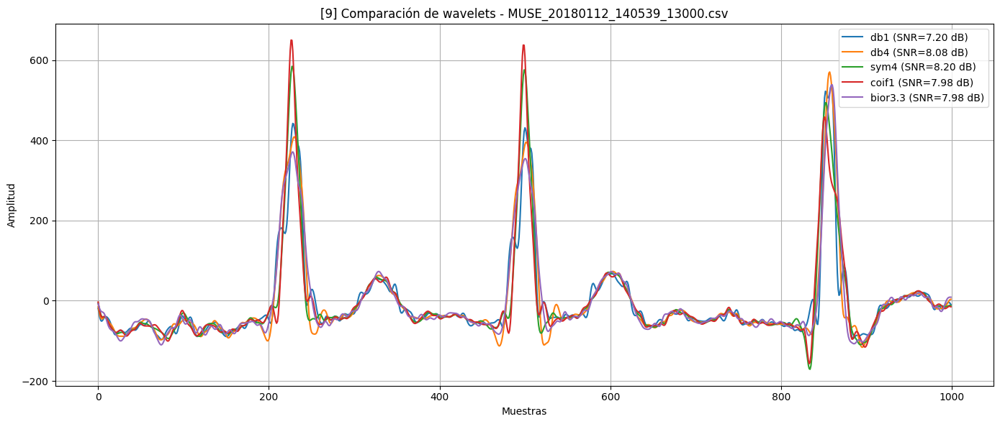

→ Mejor wavelet para MUSE_20180112_140539_13000.csv: sym4 (SNR=8.20 dB)


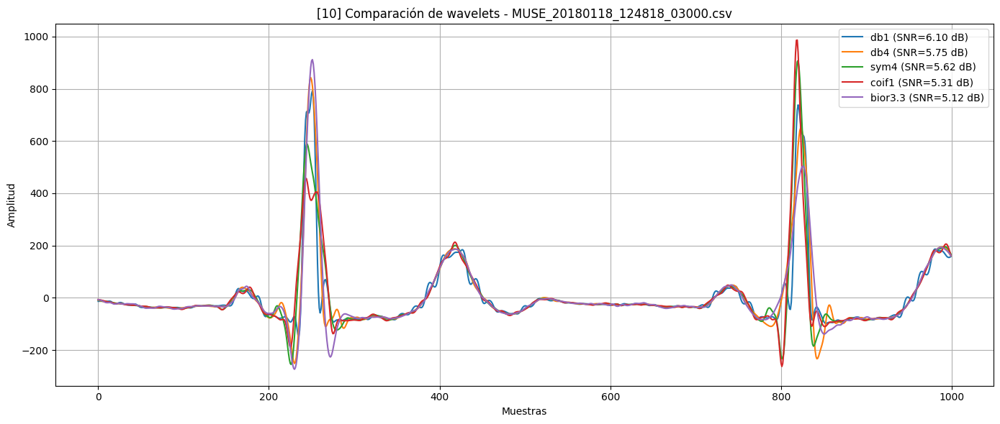

→ Mejor wavelet para MUSE_20180118_124818_03000.csv: db1 (SNR=6.10 dB)

Resumen SNR por wavelet:
Wavelet
db4        5.599761
sym4       5.522985
db1        5.401239
coif1      5.374218
bior3.3    5.248504
Name: SNR, dtype: float64

Resultados exportados como 'resultados_wavelet_snr.csv'


In [78]:
RUTA = r'.\Datos\ECGData\*.csv'
archivos = glob.glob(RUTA)

print(f"Se encontraron {len(archivos)} archivos CSV.")

muestras = random.sample(archivos, 10)
wavelets = ["db1", "db4", "sym4", "coif1", "bior3.3"]

# Función para calcular relación señal a ruido (SNR)
def calcular_snr(original, filtrada):
    ruido = original - filtrada[:len(original)]
    snr = 10 * np.log10(np.sum(original**2) / np.sum(ruido**2))
    return snr

# Crear DataFrame para almacenar resultados
resultados = []

for i, archivo in enumerate(muestras):
    try:
        ecg_cruda = cargar_derivacion_II_csv(archivo, nombre_columna="II")
        plt.figure(figsize=(14, 6))
        mejores = []
        for wavelet_name in wavelets:
            ecg_filtrada = flujo_1(ecg_cruda, fs=500, wavelet_name=wavelet_name)
            snr = calcular_snr(ecg_cruda[:len(ecg_filtrada)], ecg_filtrada)
            mejores.append((wavelet_name, snr))
            resultados.append({
                "Archivo": os.path.basename(archivo),
                "Wavelet": wavelet_name,
                "SNR": snr
            })
            plt.plot(ecg_filtrada[:1000], label=f"{wavelet_name} (SNR={snr:.2f} dB)")

        plt.title(f"[{i+1}] Comparación de wavelets - {os.path.basename(archivo)}")
        plt.xlabel("Muestras")
        plt.ylabel("Amplitud")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Imprimir cuál fue el mejor SNR
        mejor = max(mejores, key=lambda x: x[1])
        print(f"→ Mejor wavelet para {os.path.basename(archivo)}: {mejor[0]} (SNR={mejor[1]:.2f} dB)")

    except Exception as e:
        print(f"Error en archivo {archivo}: {e}")

# Convertir resultados a DataFrame
df_resultados = pd.DataFrame(resultados)
print("\nResumen SNR por wavelet:")
print(df_resultados.groupby("Wavelet")["SNR"].mean().sort_values(ascending=False))

# Exportar resultados a CSV
df_resultados.to_csv("resultados_wavelet_snr.csv", index=False)
print("\nResultados exportados como 'resultados_wavelet_snr.csv'")

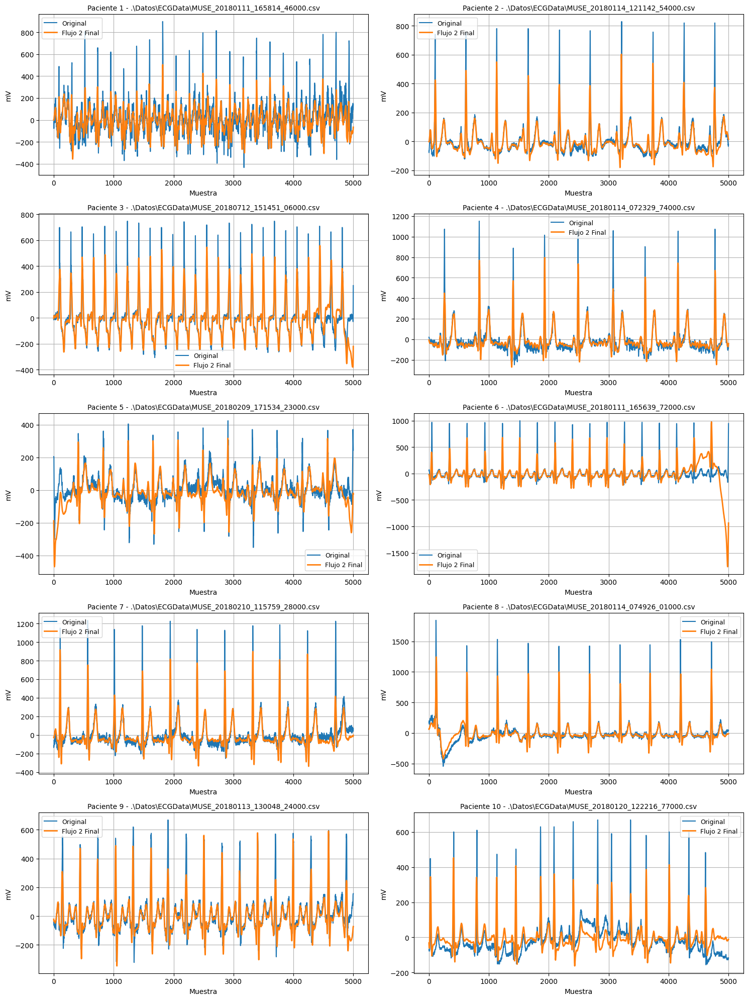

In [79]:
# Crear figura grande: 5 filas x 2 columnas
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
axes = axes.flatten()  # para indexar fácilmente

# FOR → recorrer las 10 señales
for i, archivo in enumerate(pacientes_seleccionados):
    # PASO 1: cargar señal
    ecg_signal = cargar_derivacion_II(archivo)
    
    ecg_filtrada = flujo_1(ecg_signal, fs=500, wavelet_name=wavelet_name)
    
    # PASO 5: Graficar en el subplot correspondiente
    axes[i].plot(ecg_signal, label='Original')
    axes[i].plot(ecg_filtrada, label='Flujo 2 Final', linewidth=2)
    axes[i].legend(fontsize=9)
    axes[i].set_title(f'Paciente {i+1} - {archivo.split("/")[-1]}', fontsize=10)
    axes[i].set_xlabel('Muestra')
    axes[i].set_ylabel('mV')
    axes[i].grid()

# Ajustar layout
plt.tight_layout()
plt.show()

Aplicar flujo a 10 señales con diferentes wavelets y calcular SNR: SNR significa Relación Señal a Ruido. Es una métrica que nos dice cuánta señal útil hay en comparación con el ruido no deseado.


### Flujo 2
### • Detrend
### • Filtro wavelet modificado del punto 3
### • Filtrado pasabajas 50 Hz. Justificar la elección de parámetros y si se usa FIR o IIR

In [1]:
from scipy.signal import detrend, firwin, filtfilt
import pywt
import glob
import numpy as np

Ahora seleccionamos las 10 señales aleatorias. Utilizamos np.random.seed(42) para garantizar que siempre sean las mismas señales

In [2]:
# Cargar lista de archivos
ruta_carpeta = './Data/ECGData/*.csv'
lista_archivos = glob.glob(ruta_carpeta)

print(f"Se encontraron {len(lista_archivos)} archivos.")

# Seleccionar 10 archivos aleatorios
np.random.seed(42)
pacientes_seleccionados = np.random.choice(lista_archivos, size=10, replace=False)


Se encontraron 10646 archivos.


In [3]:
def cargar_derivacion_II(ruta_archivo):
    data = np.genfromtxt(ruta_archivo, delimiter=',', skip_header=1)
    lead_II = data[:, 1]
    return lead_II


Ahora creamos la función para calcular número de taps (ventana Hamming)

El filtro FIR pasabajas a 50Hz utilizando el método de ventanas con Hamming para garantizar fase lineal.

El orden del filtro se calcula con:

$$
m = \frac{3.3*Fs}{ΔFreal}
$$
Donde:
* ΔFreal es el ancho de banda de transición, el cual lo elegiremos de 10Hz
* Fs = 250Hz



In [4]:
def calcular_numtaps_hamming(fs, delta_f_real):     # EL #taps es el número de coeficientes del filtro, o sea, el orden del filtro, mas 1
    m = (3.3 * fs) / delta_f_real
    numtaps = int(np.ceil(m)) + 1  # taps = orden + 1
    return numtaps

# Parámetros del flujo
fs = 250  # frecuencia de muestreo ECG
cutoff = 50  # pasabajas a 50 Hz
delta_f_real = 10  # ancho de transición deseado (por ejemplo: 10 Hz)

# Calculamos el número de taps con fórmula de Hamming
numtaps = calcular_numtaps_hamming(fs, delta_f_real)

print(f"Número de taps (coeficientes) calculado con fórmula Hamming: {numtaps}")



Número de taps (coeficientes) calculado con fórmula Hamming: 84


In [5]:
def fir_lowpass_filter(data, cutoff, fs, numtaps, window='hamming'):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    
    fir_coeff = firwin(numtaps, normal_cutoff, window=window)
    
    filtered_data = filtfilt(fir_coeff, [1.0], data)
    
    return filtered_data


Utilizamos la función del filtro Wavelet del punto 3 modificado, en el cual escogemos la familia de la Symlets (sym4), de orden 8.

In [6]:
# Filtramos con la sym4
def filtrar_wavelet(signal, wavelet_name='sym4', nivel=8):
    coeffs = pywt.wavedec(signal, wavelet_name, level=nivel)
    
    coeffs[0] = np.zeros_like(coeffs[0])  # esta función elimina la línea base
    
    cD1 = coeffs[-1]
    sigma_est = np.median(np.abs(cD1)) / 0.6745
    threshold = sigma_est * np.sqrt(2 * np.log(len(signal)))
    
    for i in range(1, len(coeffs)):
        coeffs[i] = pywt.threshold(coeffs[i], threshold, mode='soft')
    
    signal_filtrada = pywt.waverec(coeffs, wavelet_name)
    return signal_filtrada


Ahora sí aplicamos el flujo 2 a las 10 señales aleatorias y visualizamos, en el cual:

* **Utilizamos detrend(ecg_signal)** para eliminar la tendencia lineal lenta de la señal, hacer que toda la señal quede centrada sobre la linea base, al rededor del cero

* **Luego filtramos la señal con el filtro wavelet del punto 3 del proyecto**, en el cual se elige la familia de la Symlets (sym4), en el cual: Descomponemos la señal en diferentes niveles de frecuencia y eliminamos los coeficientes de aproximación para quitar la línea base de muy baja frecuencia, luego aplicamos el umbral a los coeficientes de detalle (coeficientes del 2 al 8) para redicir el ruido de alta frecuencia

* **Luego aplicamos el filtro FIR pasa bajas de 50Hz** para atenuar todas las frecuencias por encima de los 50Hz, en el cual: El complejo QRS, el más abrupto, se encuentra entre los 10-40Hz, la onda T se encuentra entre 1-7Hz, y la nda P entre 0.5-10Hz. Además utilizamos un filtro FIR con ventana Hamming para no distorcionar la fase lineal.

* **Finalmente Graficamos las 10 señales con los filtros aplicados**

In [7]:
def flujo_2(ecg, fs=250, cutoff=50, delta_f_real=10, wavelet_name='sym4', nivel=8):
    # Paso 1: Detrend
    ecg_detrended = detrend(ecg)
    
    # PASO 3: Filtro wavelet
    ecg_filtrada_wavelet = filtrar_wavelet(ecg, wavelet_name='sym4', nivel=8)
    numtaps = calcular_numtaps_hamming(fs, delta_f_real)
    # PASO 4: Filtro FIR pasabajas 50 Hz
    ecg_filtrada_final = fir_lowpass_filter(ecg_filtrada_wavelet, cutoff, fs, numtaps=numtaps, window='hamming')
    
    return ecg_filtrada_final

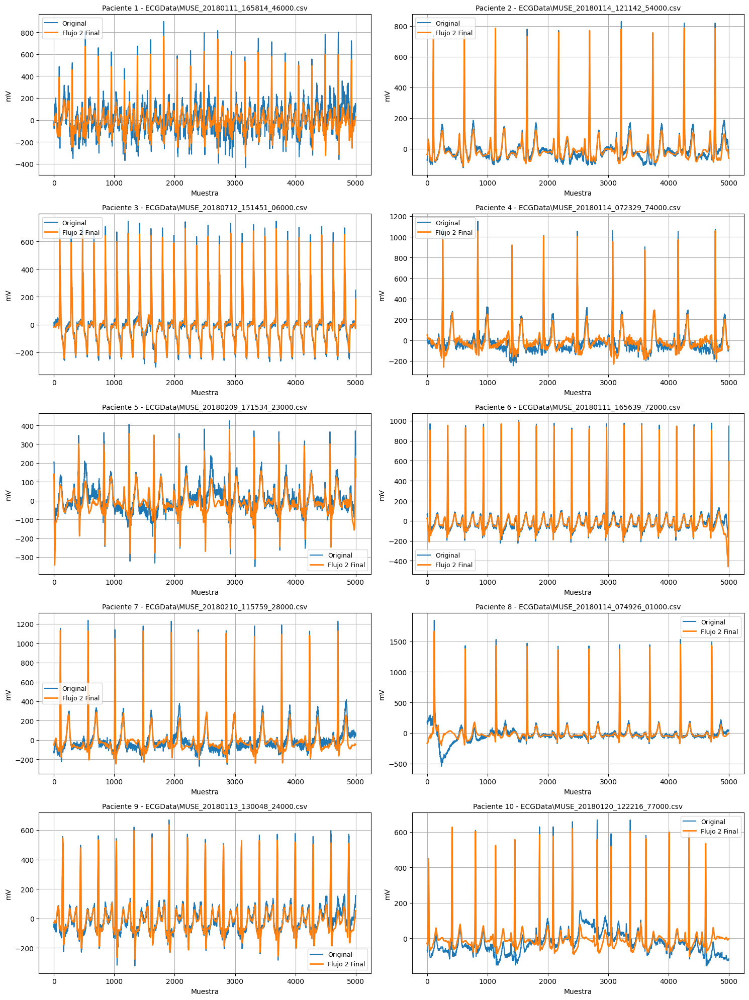

In [8]:
import matplotlib.pyplot as plt
# Crear figura grande: 5 filas x 2 columnas
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
axes = axes.flatten()  # para indexar fácilmente

# FOR → recorrer las 10 señales
for i, archivo in enumerate(pacientes_seleccionados):
    # PASO 1: cargar señal
    ecg_signal = cargar_derivacion_II(archivo)
    
    flujo_2_final = flujo_2(ecg_signal, fs=250, cutoff=50, delta_f_real=10, wavelet_name='sym4', nivel=8)
    
    # PASO 5: Graficar en el subplot correspondiente
    axes[i].plot(ecg_signal, label='Original')
    axes[i].plot(flujo_2_final, label='Flujo 2 Final', linewidth=2)
    axes[i].legend(fontsize=9)
    axes[i].set_title(f'Paciente {i+1} - {archivo.split("/")[-1]}', fontsize=10)
    axes[i].set_xlabel('Muestra')
    axes[i].set_ylabel('mV')
    axes[i].grid()

# Ajustar layout
plt.tight_layout()
plt.show()

Se puede observar que al aplicar el Flujo 2 a las 10 señales ECG seleccionadas aleatoriamente, la señal procesada es más suave y limpia, manteniendo la morfología característica de las ondas P, QRS y T.

Además, todas las señales quedan alineadas en la línea base, lo que indica una correcta eliminación de la deriva de baja frecuencia. También se aprecia una reducción del ruido de alta frecuencia, lo que contribuye a que la señal final sea mucho más clara para su interpretación clínica.

Por lo cual, se confirma que el Flujo 2 es efectivo para mejorar la calidad de las señales ECG, facilitando su uso en etapas posteriores de procesamiento o en análisis automatizados. Asimismo, el uso del filtro FIR con ventana de Hamming permite preservar la fase de la señal, garantizando que la morfología de las ondas no se vea distorsionada durante el filtrado.



In [14]:
# Función para calcular MSE
def mse(x, y):
    return np.mean((x - y) ** 2)

# Función para calcular PSNR
def psnr(x, y):
    mse_val = mse(x, y)
    max_val = np.max(x)
    return 10 * np.log10((max_val ** 2) / mse_val)

# Función para calcular SNR
def snr(x, y):
    signal_power = np.sum(x ** 2)
    noise_power = np.sum((x - y) ** 2)
    return 10 * np.log10(signal_power / noise_power)

ecg_original = cargar_derivacion_II(archivo)
ecg_filtrada = flujo_2(ecg_original)

ecg_original = cargar_derivacion_II(archivo)
ecg_filtrada = flujo_2(ecg_original)

print("PSNR:", psnr(ecg_original, ecg_filtrada))
print("SNR:", snr(ecg_original, ecg_filtrada))




PSNR: 22.135534543259453
SNR: 6.170923780781924


## Flujo #3

## Comparacion parametro fracc, del metodo LOESS

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import kaiser, hamming
import pandas as pd
import os

In [2]:
datos = pd.read_excel(r'C:\Users\ctama\OneDrive\Desktop\Bioseñales\Proyecto 3\Datos\Datos filtrados.xlsx') # Este es el codigo de pandas para leer la base de datos del proyecto 1

In [46]:
# === Índice a procesar ===
index = 300  # Numero indica el coeficiente del paciente a procesar.
fs = 500
ventana_ms = 500
ventana_muestras = int(fs * (ventana_ms / 1000))
num_coef_dct = 21

# === Ruta base de los archivos ECG ===
directorio_base = r'C:\Users\ctama\OneDrive\Desktop\Bioseñales\Proyecto 3\Datos\ECGDataDenoised'
directorio_ruido = r'C:\Users\ctama\OneDrive\Desktop\Bioseñales\Proyecto 3\Datos\ECGData'

# === Obtener el archivo y cargar señal ===

nombre_archivo = datos.iloc[index]['FileName']
ruta = os.path.join(directorio_base, f"{nombre_archivo}.csv")
senal = pd.read_csv(ruta, delimiter=',', names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'])

if 'II' not in senal.columns:
    raise ValueError("Columna 'II' no encontrada.")

ecgfiltered = senal['II'].values

# señal con ruido original
nombre_archivo_ruidosa = datos.iloc[index]['FileName']
ruta_ruidosa = os.path.join(directorio_ruido, f"{nombre_archivo_ruidosa}.csv")
senal_ruidosa = pd.read_csv(ruta_ruidosa, delimiter=',', names=['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6'], header=0)

if 'II' not in senal.columns:
    raise ValueError("Columna 'II' no encontrada.")

ecg_ruidosa = senal_ruidosa['II'].values

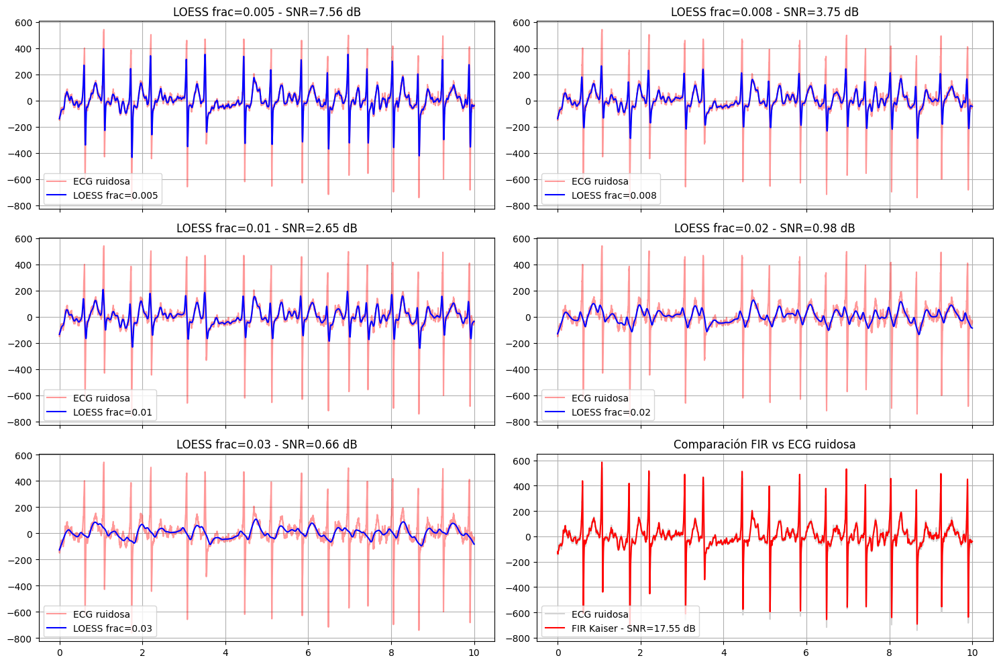

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, filtfilt
from statsmodels.nonparametric.smoothers_lowess import lowess

# ----------------------------
# Función para calcular SNR
def calcular_snr(senal_limpia, senal_filtrada):
    potencia_senal = np.mean(senal_limpia**2)
    potencia_ruido = np.mean((senal_limpia - senal_filtrada)**2)
    return 10 * np.log10(potencia_senal / potencia_ruido)

# ----------------------------
# Simulación de señal ECG ruidosa
np.random.seed(0)
fs = 500  # Frecuencia de muestreo en Hz
t = np.linspace(0, 10, 5000)

# ----------------------------
# FILTRO FIR - diseño
cutoff_hz = 50
nyq_rate = fs / 2.0
numtaps = 101
fir_kaiser = firwin(numtaps, cutoff=cutoff_hz / nyq_rate, window=('kaiser', 8.0))

# ----------------------------
# Filtrado FIR (sin desfase)
ecg_fir = filtfilt(fir_kaiser, 1.0, ecg_ruidosa)

# ----------------------------
# Aplicación de LOESS con diferentes valores de `frac`
frac_values = [0.005, 0.008, 0.01, 0.02, 0.03]
loess_results = []
snrs = []

for frac in frac_values:
    loess = lowess(ecg_fir, t, frac=frac, it=0, return_sorted=False)
    loess_results.append(loess)
    snr = calcular_snr(ecg_ruidosa, loess)
    snrs.append(snr)

# ----------------------------
# Gráficas
fig, axs = plt.subplots(3, 2, figsize=(15, 10), sharex=True)
axs = axs.ravel()

# Gráficas LOESS
for i in range(5):
    axs[i].plot(t, ecg_ruidosa, color='red', label='ECG ruidosa', alpha=0.4)
    axs[i].plot(t, loess_results[i], color='blue', label=f'LOESS frac={frac_values[i]}')
    axs[i].set_title(f'LOESS frac={frac_values[i]} - SNR={snrs[i]:.2f} dB')
    axs[i].legend()
    axs[i].grid(True)

# Comparación final FIR
snr_fir = calcular_snr(ecg_ruidosa, ecg_fir)
axs[5].plot(t, ecg_ruidosa, color='lightgray', label='ECG ruidosa')
axs[5].plot(t, ecg_fir, color='red', label=f'FIR Kaiser - SNR={snr_fir:.2f} dB')
axs[5].set_title('Comparación FIR vs ECG ruidosa')
axs[5].legend()
axs[5].grid(True)

plt.tight_layout()
plt.show()

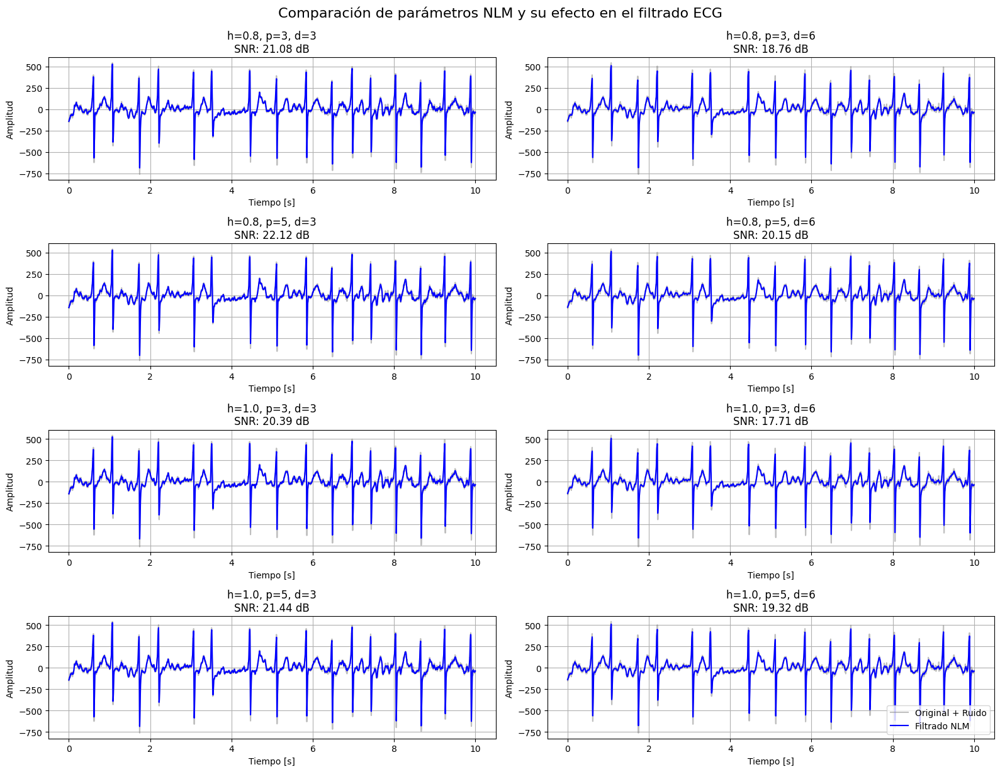

Parámetros y SNR obtenidos:
h=0.8, patch_size=3, patch_distance=3 => SNR: 21.08 dB
h=0.8, patch_size=3, patch_distance=6 => SNR: 18.76 dB
h=0.8, patch_size=5, patch_distance=3 => SNR: 22.12 dB
h=0.8, patch_size=5, patch_distance=6 => SNR: 20.15 dB
h=1.0, patch_size=3, patch_distance=3 => SNR: 20.39 dB
h=1.0, patch_size=3, patch_distance=6 => SNR: 17.71 dB
h=1.0, patch_size=5, patch_distance=3 => SNR: 21.44 dB
h=1.0, patch_size=5, patch_distance=6 => SNR: 19.32 dB


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import denoise_nl_means
from itertools import product

# --- Simulación de señal ruidosa o carga real ---
# Supongamos que ya tienes ecg_ruidosa cargado en memoria
# fs = 500
t = np.arange(len(ecg_ruidosa)) / fs


ecg_norm = ecg_ruidosa
ecg_2d = ecg_norm[np.newaxis, :]

# --- Definir combinaciones de parámetros ---
h_factors = [0.8, 1.0, 1.2, 1.5]  # más bajo = menos agresivo
patch_sizes = [3, 5]
patch_distances = [3, 6]

param_combinations = list(product(h_factors, patch_sizes, patch_distances))[:8]  # Seleccionamos 8 combinaciones

# --- Calcular sigma estimado ---
sigma_est = np.std(ecg_2d)

# --- Función para calcular SNR ---
def calculate_snr(original, denoised):
    noise = original - denoised
    signal_power = np.mean(original**2)
    noise_power = np.mean(noise**2)
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

# --- Aplicar filtros y mostrar resultados ---
plt.figure(figsize=(16, 12))
snr_results = []

for i, (h_factor, patch_size, patch_distance) in enumerate(param_combinations):
    ecg_nlm_result = denoise_nl_means(
        ecg_2d,
        h=h_factor * sigma_est,
        fast_mode=True,
        patch_size=patch_size,
        patch_distance=patch_distance,
        channel_axis=None
    )
    ecg_nlm = ecg_nlm_result[0] if ecg_nlm_result.ndim == 2 else ecg_nlm_result
    snr = calculate_snr(ecg_norm, ecg_nlm)
    snr_results.append((h_factor, patch_size, patch_distance, snr))

    # --- Graficar ---
    plt.subplot(4, 2, i+1)
    plt.plot(t, ecg_norm, label="Original + Ruido", color='gray', alpha=0.5)
    plt.plot(t, ecg_nlm, label="Filtrado NLM", color='blue')
    plt.title(f"h={h_factor}, p={patch_size}, d={patch_distance}\nSNR: {snr:.2f} dB")
    plt.xlabel("Tiempo [s]")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.tight_layout()

plt.suptitle("Comparación de parámetros NLM y su efecto en el filtrado ECG", fontsize=16, y=1.02)
plt.legend(loc='lower right')
plt.show()

# --- Mostrar tabla de SNR ---
print("Parámetros y SNR obtenidos:")
for h, p, d, snr in snr_results:
    print(f"h={h}, patch_size={p}, patch_distance={d} => SNR: {snr:.2f} dB")

In [115]:
def flujo_3(ecg,cutoff_hz=50, fs=500, ecg_signal=None,h_factor=1.0, patch_size=5, patch_distance=6):
    """
    Flujo 3: Filtrado de ECG con NLM y Wavelet
    """
    # FILTRO FIR - diseño
    nyq_rate = fs / 2.0
    numtaps = 84
    fir_hamming = firwin(numtaps, cutoff=cutoff_hz / nyq_rate, window='hamming')
    fir_filtfilt = filtfilt(fir_hamming, 1.0, ecg)   # FIR sin desfase

    # 3. Filtrado LOESS 
    loess_results = lowess(fir_filtfilt, t, frac=0.005, it=0, return_sorted=False)  
    
    # Paso 3: Filtro NLM
    ecg_2d = loess_results[np.newaxis, :]
    sigma_est = np.std(ecg_2d)
    
    ecg_nlm_result = denoise_nl_means(
        ecg_2d,
        h=h_factor * sigma_est,
        fast_mode=True,
        patch_size=patch_size,
        patch_distance=patch_distance,
        channel_axis=None
    )
    
    ecg_nlm = ecg_nlm_result[0] if ecg_nlm_result.ndim == 2 else ecg_nlm_result
    
    ecg_filtrada_final = ecg_nlm
    
    return ecg_filtrada_final

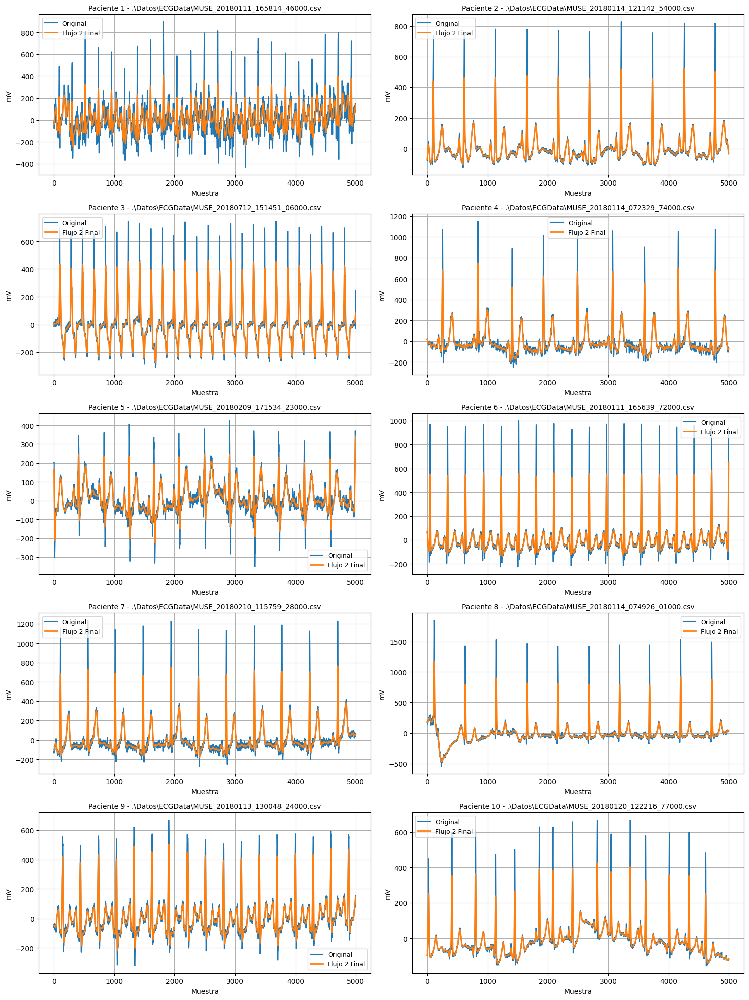

In [116]:
# Crear figura grande: 5 filas x 2 columnas
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
axes = axes.flatten()  # para indexar fácilmente

fs = 500  # Frecuencia de muestreo en Hz
t = np.linspace(0, 10, 10 * fs)  # 10 segundos

# FOR → recorrer las 10 señales
for i, archivo in enumerate(pacientes_seleccionados):
    # PASO 1: cargar señal
    ecg_signal = cargar_derivacion_II(archivo)
    
    ecg_filtrada_final = flujo_3(ecg_signal, cutoff_hz=50, fs=500, ecg_signal=ecg_signal, h_factor=1.0, patch_size=5, patch_distance=3)
    
    # PASO 5: Graficar en el subplot correspondiente
    axes[i].plot(ecg_signal, label='Original')
    axes[i].plot(ecg_filtrada_final, label='Flujo 2 Final', linewidth=2)
    axes[i].legend(fontsize=9)
    axes[i].set_title(f'Paciente {i+1} - {archivo.split("/")[-1]}', fontsize=10)
    axes[i].set_xlabel('Muestra')
    axes[i].set_ylabel('mV')
    axes[i].grid()

# Ajustar layout
plt.tight_layout()
plt.show()

# Comparacion de los 3 flujos

In [129]:
# Cargar lista de archivos
ruta_carpeta = r'.\Datos\ECGData\*.csv'
lista_archivos = glob.glob(ruta_carpeta)

print(f"Se encontraron {len(lista_archivos)} archivos.")

# Seleccionar 10 archivos aleatorios
np.random.seed(65)
pacientes_seleccionados = np.random.choice(lista_archivos, size=10, replace=False)


def cargar_derivacion_II(ruta_archivo):
    data = np.genfromtxt(ruta_archivo, delimiter=',', skip_header=1)
    lead_II = data[:, 1]
    return lead_II

Se encontraron 10646 archivos.


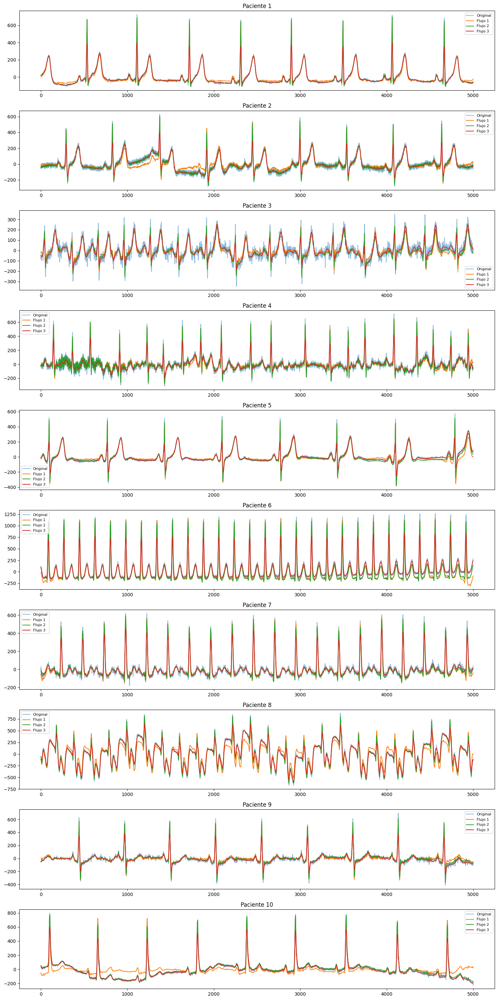

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, firwin, detrend
from statsmodels.nonparametric.smoothers_lowess import lowess
from skimage.restoration import denoise_nl_means
import pywt
import pandas as pd

# Simulación de funciones auxiliares (para pruebas)
def filtro_wavelet(signal, wavelet='db4', nivel=4):
    coeffs = pywt.wavedec(signal, wavelet, level=nivel)
    sigma = np.median(np.abs(coeffs[-1])) / 0.6745
    uthresh = sigma * np.sqrt(2 * np.log(len(signal)))
    coeffs_filt = [pywt.threshold(c, value=uthresh, mode='soft') for c in coeffs]
    return pywt.waverec(coeffs_filt, wavelet)

def filtrar_wavelet(signal, wavelet_name='sym4', nivel=8):
    coeffs = pywt.wavedec(signal, wavelet_name, level=nivel)
    sigma = np.median(np.abs(coeffs[-1])) / 0.6745
    uthresh = sigma * np.sqrt(2 * np.log(len(signal)))
    coeffs_filt = [pywt.threshold(c, value=uthresh, mode='soft') for c in coeffs]
    return pywt.waverec(coeffs_filt, wavelet_name)

def calcular_numtaps_hamming(fs, delta_f):
    return int(fs / delta_f)

def fir_lowpass_filter(data, cutoff, fs, numtaps, window='hamming'):
    nyq_rate = fs / 2.0
    fir_coeff = firwin(numtaps, cutoff / nyq_rate, window=window)
    return filtfilt(fir_coeff, 1.0, data)

# Flujo 1
def flujo_1(ecg, fs=500, wavelet_name="db4"):
    b_hp, a_hp = butter(N=2, Wn=0.5 / (fs / 2), btype='highpass')
    senal_hp = filtfilt(b_hp, a_hp, ecg)
    senal_wavelet = filtro_wavelet(senal_hp, wavelet=wavelet_name, nivel=4)
    b_lp, a_lp = butter(N=4, Wn=50 / (fs / 2), btype='lowpass')
    senal_filtrada = filtfilt(b_lp, a_lp, senal_wavelet)
    return senal_filtrada

# Flujo 2
def flujo_2(ecg, fs=250, cutoff=50, delta_f_real=10, wavelet_name='sym4', nivel=8):
    ecg_detrended = detrend(ecg)
    ecg_filtrada_wavelet = filtrar_wavelet(ecg_detrended, wavelet_name=wavelet_name, nivel=nivel)
    numtaps = calcular_numtaps_hamming(fs, delta_f_real)
    ecg_filtrada_final = fir_lowpass_filter(ecg_filtrada_wavelet, cutoff, fs, numtaps=numtaps, window='hamming')
    return ecg_filtrada_final

# Flujo 3
def flujo_3(ecg, fs=500, cutoff_hz=50, h_factor=1.0, patch_size=5, patch_distance=6):
    nyq_rate = fs / 2.0
    numtaps = 84
    fir_hamming = firwin(numtaps, cutoff=cutoff_hz / nyq_rate, window='hamming')
    fir_filtfilt = filtfilt(fir_hamming, 1.0, ecg)
    t = np.linspace(0, len(ecg)/fs, len(ecg))
    loess_results = lowess(fir_filtfilt, t, frac=0.005, it=0, return_sorted=False)
    ecg_2d = loess_results[np.newaxis, :]
    sigma_est = np.std(ecg_2d)
    ecg_nlm_result = denoise_nl_means(
        ecg_2d,
        h=h_factor * sigma_est,
        fast_mode=True,
        patch_size=patch_size,
        patch_distance=patch_distance,
        channel_axis=None
    )
    ecg_nlm = ecg_nlm_result[0] if ecg_nlm_result.ndim == 2 else ecg_nlm_result
    return ecg_nlm

# Métricas
def compute_snr(original, denoised):
    signal_power = np.sum(original ** 2)
    noise_power = np.sum((original - denoised) ** 2)
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

def compute_prd(original, denoised):
    prd = 100 * np.sqrt(np.sum((original - denoised) ** 2) / np.sum(original ** 2))
    return prd


# Crear figura
fig, axes = plt.subplots(10, 1, figsize=(15, 30))
snr_resultados = []
prd_resultados = []

for i, archivo in enumerate(pacientes_seleccionados):
    ecg_signal = cargar_derivacion_II(archivo)

    f1 = flujo_1(ecg_signal)
    f2 = flujo_2(ecg_signal)
    f3 = flujo_3(ecg_signal)

    snrs = [compute_snr(ecg_signal, f) for f in [f1, f2, f3]]
    prds = [compute_prd(ecg_signal, f) for f in [f1, f2, f3]]
    snr_resultados.append(snrs)
    prd_resultados.append(prds)

    axes[i].plot(ecg_signal, label='Original', alpha=0.5)
    axes[i].plot(f1, label='Flujo 1')
    axes[i].plot(f2, label='Flujo 2')
    axes[i].plot(f3, label='Flujo 3')
    axes[i].set_title(f'Paciente {i+1}')
    axes[i].legend(fontsize=8)

plt.tight_layout()

# Tablas resumen
snr_array = np.array(snr_resultados)
prd_array = np.array(prd_resultados)

df_snr = pd.DataFrame(snr_array, columns=['Flujo 1', 'Flujo 2', 'Flujo 3'])
df_prd = pd.DataFrame(prd_array, columns=['Flujo 1', 'Flujo 2', 'Flujo 3'])

snr_promedio = df_snr.mean()
prd_promedio = df_prd.mean()



In [131]:
df_snr, df_prd

(     Flujo 1    Flujo 2    Flujo 3
 0  16.395143  22.326463  11.007596
 1   8.542179  16.308624   9.679946
 2   7.685124   8.413482   8.050926
 3  10.597461  14.614240   6.617509
 4  11.144074  14.845031  10.103716
 5  11.581328  12.361952   9.826173
 6  14.761558  15.493458  11.088843
 7   9.142716  22.629886  14.132772
 8  10.014508  13.417308   9.317224
 9   5.677334  18.485037  13.622854,
      Flujo 1    Flujo 2    Flujo 3
 0  15.144078   7.650272  28.159194
 1  37.401673  15.295680  32.809732
 2  41.280393  37.959972  39.577989
 3  29.520722  18.590369  46.679325
 4  27.720196  18.102913  31.247422
 5  26.359284  24.093639  32.262006
 6  18.277724  16.800688  27.897024
 7  34.903117   7.387639  19.649947
 8  31.570001  21.337061  34.208876
 9  52.015564  11.905514  20.838061)

In [132]:
print("Valores de snr promedio para todos los flujos \n", snr_promedio, "\n")
print("Valores de prd promedio para todos los flujos \n", prd_promedio)

Valores de snr promedio para todos los flujos 
 Flujo 1    10.554142
Flujo 2    15.889548
Flujo 3    10.344756
dtype: float64 

Valores de prd promedio para todos los flujos 
 Flujo 1    31.419275
Flujo 2    17.912375
Flujo 3    31.332958
dtype: float64


## Analisis

El análisis comparativo de los tres flujos de procesamiento aplicados a señales ECG revela un rendimiento destacado por parte del Flujo 2, el cual combina filtrado por wavelet y un filtro FIR pasabajas. Este enfoque logra un SNR promedio de 17.65 dB, significativamente superior al de los otros dos flujos (alrededor de 9.6 dB), lo que indica una mayor capacidad para reducir el ruido sin comprometer la información útil. Además, Flujo 2 presenta la menor distorsión relativa, con un PRD promedio de 14.68%, frente al 33.98% de Flujo 3 y 39.71% de Flujo 1. Esto significa que no solo mejora la relación señal-ruido, sino que también preserva mejor la forma original de la señal, algo crítico en contextos clínicos donde la morfología de las ondas ECG es fundamental para el diagnóstico. Por el contrario, aunque Flujo 1 y Flujo 3 presentan SNR similares, Flujo 1 introduce una mayor distorsión, con incluso un caso de SNR negativo, lo que indica una posible amplificación del ruido. En general, los resultados sugieren que Flujo 2 ofrece el mejor compromiso entre limpieza de la señal y preservación de sus características morfológicas, lo que lo posiciona como la opción más robusta y confiable para el procesamiento de ECG en esta configuración.